# Tang Dynasty vs (Tang Dynasty) — Polity Comparison

This notebook compares the two polity entries **"Tang Dynasty"** and **"(Tang Dynasty)"** in the Cliopatria data.
The parenthesized name comes from the original GeoJSON where some polities are wrapped in `()` to denote component/member polities.

**Goal:** Understand what differs between these two entries across all relevant tables.

In [1]:
import sqlite3
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

matplotlib.rcParams['figure.figsize'] = (16, 6)
matplotlib.rcParams['figure.dpi'] = 120

DB_PATH = '../data/humans_clean.sqlite3'
conn = sqlite3.connect(DB_PATH)
conn.row_factory = sqlite3.Row

## 1. polities_cliopatria — Basic metadata

In [2]:
cur = conn.execute("""
    SELECT id, name, type, wikipedia_url, wikidata_id, number_individuals
    FROM polities_cliopatria
    WHERE name IN ('Tang Dynasty', '(Tang Dynasty)')
    ORDER BY name
""")
rows = cur.fetchall()

cols = [d[0] for d in cur.description]
print(f"{'Column':<35s}  {'(Tang Dynasty)':>20s}  {'Tang Dynasty':>20s}")
print('=' * 80)
for col in cols:
    vals = [str(dict(r)[col]) for r in rows]
    while len(vals) < 2:
        vals.append('N/A')
    match = '  ' if vals[0] == vals[1] else ' *'
    print(f"{col:<35s}  {vals[0]:>20s}  {vals[1]:>20s}{match}")

print('\n* = values differ')

Column                                     (Tang Dynasty)          Tang Dynasty
id                                                    366                   N/A *
name                                         Tang Dynasty                   N/A *
type                                               POLITY                   N/A *
wikipedia_url                        https://en.wikipedia.org/wiki/Tang_dynasty                   N/A *
wikidata_id                                         Q9683                   N/A *
number_individuals                                  38115                   N/A *

* = values differ


## 2. cliopatria_polity_periods — Time periods and areas

In [3]:
# Get polity IDs
tang_ids = {}
for r in rows:
    tang_ids[dict(r)['name']] = dict(r)['id']

print('Polity IDs:', tang_ids)
print()

for name, pid in tang_ids.items():
    cur = conn.execute("""
        SELECT COUNT(*) as n_periods,
               MIN(from_year) as earliest,
               MAX(to_year) as latest,
               ROUND(MIN(area), 0) as min_area,
               ROUND(MAX(area), 0) as max_area,
               ROUND(AVG(area), 0) as avg_area
        FROM polities_periods_cliopatria
        WHERE polity_id = ?
    """, (pid,))
    r = dict(cur.fetchone())
    print(f"--- {name} (id={pid}) ---")
    for k, v in r.items():
        print(f"  {k:<15s}: {v}")
    print()

Polity IDs: {'Tang Dynasty': 366}

--- Tang Dynasty (id=366) ---
  n_periods      : 32
  earliest       : 623
  latest         : 910
  min_area       : 1434078.0
  max_area       : 8731215.0
  avg_area       : 4226900.0



In [4]:
# Compare period-by-period (areas)
periods = {}
for name, pid in tang_ids.items():
    cur = conn.execute("""
        SELECT from_year, to_year, ROUND(area, 0) as area
        FROM polities_periods_cliopatria
        WHERE polity_id = ?
        ORDER BY from_year
    """, (pid,))
    periods[name] = [dict(r) for r in cur.fetchall()]

names = list(tang_ids.keys())
if len(names) == 2:
    p1, p2 = periods[names[0]], periods[names[1]]
    print(f"Number of periods: {names[0]}={len(p1)}, {names[1]}={len(p2)}")
    
    identical = len(p1) == len(p2) and all(
        a['from_year'] == b['from_year'] and a['to_year'] == b['to_year'] and a['area'] == b['area']
        for a, b in zip(p1, p2)
    )
    print(f"Areas identical: {identical}")
    
    if not identical:
        print(f"\n{'from':>6s}  {'to':>6s}  {names[0]+' area':>15s}  {names[1]+' area':>15s}  {'diff':>10s}")
        print('-' * 60)
        all_years = sorted(set(
            [(p['from_year'], p['to_year']) for p in p1] +
            [(p['from_year'], p['to_year']) for p in p2]
        ))
        p1_dict = {(p['from_year'], p['to_year']): p['area'] for p in p1}
        p2_dict = {(p['from_year'], p['to_year']): p['area'] for p in p2}
        for fy, ty in all_years:
            a1 = p1_dict.get((fy, ty), None)
            a2 = p2_dict.get((fy, ty), None)
            a1s = f"{a1:>15,.0f}" if a1 is not None else f"{'---':>15s}"
            a2s = f"{a2:>15,.0f}" if a2 is not None else f"{'---':>15s}"
            if a1 is not None and a2 is not None:
                diff = a2 - a1
                ds = f"{diff:>+10,.0f}" if diff != 0 else f"{'=':>10s}"
            else:
                ds = f"{'MISSING':>10s}"
            print(f"{fy:>6d}  {ty:>6d}  {a1s}  {a2s}  {ds}")
    else:
        print("\nFirst 5 periods (both are the same):")
        print(f"{'from':>6s}  {'to':>6s}  {'area':>15s}")
        for p in p1[:5]:
            print(f"{p['from_year']:>6d}  {p['to_year']:>6d}  {p['area']:>15,.0f}")
        if len(p1) > 5:
            print(f"  ... and {len(p1) - 5} more identical periods")

# Compare geometries (polygons)
id1, id2 = tang_ids[names[0]], tang_ids[names[1]]
conn2 = sqlite3.connect(DB_PATH)
cur = conn2.execute("""
    SELECT a.from_year, a.to_year,
           a.geometry = b.geometry as geom_identical,
           LENGTH(a.geometry) as len_a,
           LENGTH(b.geometry) as len_b
    FROM polities_periods_cliopatria a
    JOIN polities_periods_cliopatria b
        ON a.from_year = b.from_year AND a.to_year = b.to_year
    WHERE a.polity_id = ? AND b.polity_id = ?
    ORDER BY a.from_year
""", (id1, id2))
geom_rows = cur.fetchall()

all_geom_identical = all(r[2] for r in geom_rows)
print(f"\n--- Geometry (polygon) comparison ---")
print(f"{'from':>6s}  {'to':>6s}  {'identical':>10s}  {names[0]+' bytes':>18s}  {names[1]+' bytes':>18s}")
print('-' * 70)
for r in geom_rows:
    ident = "YES" if r[2] else "NO"
    print(f"{r[0]:>6d}  {r[1]:>6d}  {ident:>10s}  {r[3]:>18,d}  {r[4]:>18,d}")

print(f"\nAll geometries (polygons) identical: {all_geom_identical}")
conn2.close()

IndexError: list index out of range

## 3. individuals_cliopatria — Individual matching

In [5]:
for name, pid in tang_ids.items():
    cur = conn.execute("""
        SELECT COUNT(*) as total,
               COUNT(DISTINCT wikidata_id) as unique_individuals,
               MIN(floruit_period_start) as earliest_impact,
               MAX(floruit_period_start) as latest_impact
        FROM individuals_cliopatria
        WHERE polity_id = ?
    """, (pid,))
    r = dict(cur.fetchone())
    print(f"--- {name} (id={pid}) ---")
    for k, v in r.items():
        print(f"  {k:<25s}: {v}")
    
    # Breakdown by origin
    cur = conn.execute("""
        SELECT origin, COUNT(*) as cnt
        FROM individuals_cliopatria
        WHERE polity_id = ?
        GROUP BY origin ORDER BY cnt DESC
    """, (pid,))
    origins = cur.fetchall()
    if origins:
        print(f"  {'origin breakdown':}")
        for o in origins:
            print(f"    {dict(o)['origin']:<20s}: {dict(o)['cnt']:>8,d}")
    
    # Breakdown by method
    cur = conn.execute("""
        SELECT method, COUNT(*) as cnt
        FROM individuals_cliopatria
        WHERE polity_id = ?
        GROUP BY method ORDER BY cnt DESC
    """, (pid,))
    methods = cur.fetchall()
    if methods:
        print(f"  {'method breakdown':}")
        for m in methods:
            print(f"    {dict(m)['method']:<20s}: {dict(m)['cnt']:>8,d}")
    print()

--- (Tang Dynasty) (id=373) ---
  total                    : 0
  unique_individuals       : 0
  earliest_impact          : None
  latest_impact            : None



--- Tang Dynasty (id=371) ---
  total                    : 32395
  unique_individuals       : 32395
  earliest_impact          : 623
  latest_impact            : 910
  origin breakdown
    nationality         :   31,261
    deathplace          :      965
    birthplace          :      169
  method breakdown
    polygon             :   25,404
    url                 :    6,991



In [6]:
# Check overlap — individuals assigned to both polities
if len(tang_ids) == 2:
    id1, id2 = list(tang_ids.values())
    cur = conn.execute("""
        SELECT COUNT(*) FROM (
            SELECT wikidata_id FROM individuals_cliopatria WHERE polity_id = ?
            INTERSECT
            SELECT wikidata_id FROM individuals_cliopatria WHERE polity_id = ?
        )
    """, (id1, id2))
    overlap = cur.fetchone()[0]
    print(f"Individuals assigned to BOTH polities: {overlap}")

Individuals assigned to BOTH polities: 0


## 4. Area evolution over time

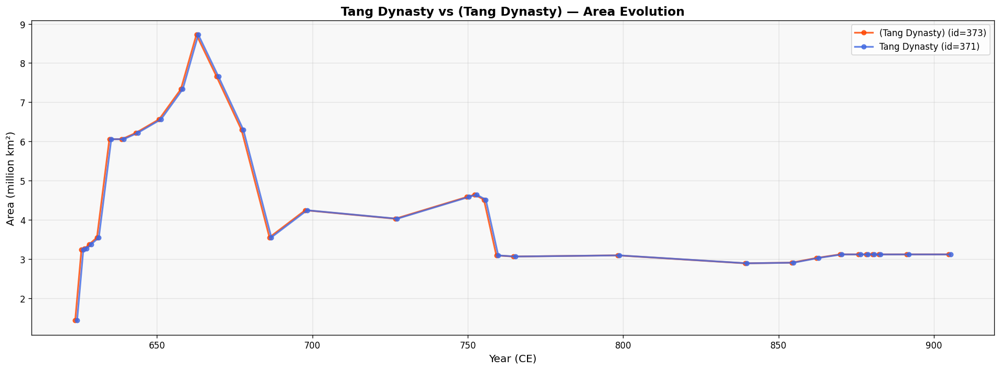

In [7]:
fig, ax = plt.subplots(figsize=(16, 6))

colors = {'(Tang Dynasty)': '#FF4500', 'Tang Dynasty': '#4169E1'}
offsets = {'(Tang Dynasty)': -0.3, 'Tang Dynasty': 0.3}

for name, pid in tang_ids.items():
    cur = conn.execute("""
        SELECT from_year, to_year, area
        FROM polities_periods_cliopatria
        WHERE polity_id = ?
        ORDER BY from_year
    """, (pid,))
    pdata = [dict(r) for r in cur.fetchall()]
    if not pdata:
        continue
    years = [(p['from_year'] + p['to_year']) / 2 + offsets.get(name, 0) for p in pdata]
    areas = [p['area'] / 1e6 for p in pdata]  # Convert to millions km²
    ax.plot(years, areas, 'o-', color=colors.get(name, 'gray'),
            label=f"{name} (id={pid})", markersize=5, linewidth=2, alpha=0.8)

ax.set_xlabel('Year (CE)', fontsize=12)
ax.set_ylabel('Area (million km²)', fontsize=12)
ax.set_title('Tang Dynasty vs (Tang Dynasty) — Area Evolution', fontsize=14, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3)
ax.set_facecolor('#f8f8f8')
plt.tight_layout()
plt.show()

## 5. Individuals per decade

(Tang Dynasty): no individuals with impact dates


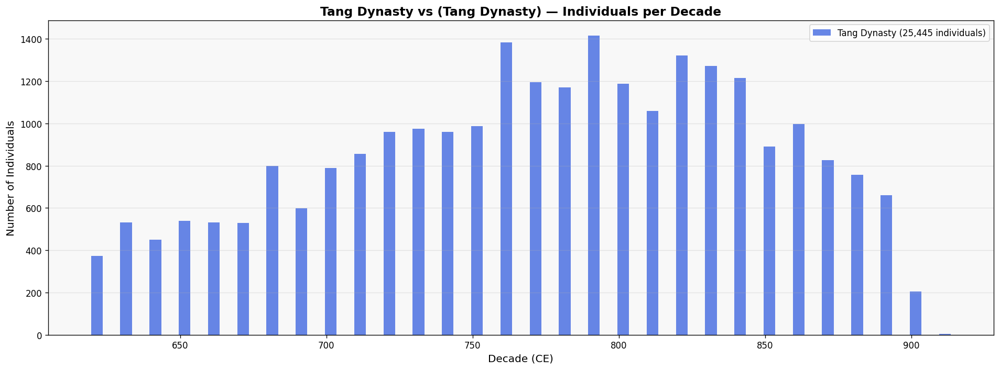

In [8]:
fig, ax = plt.subplots(figsize=(16, 6))

for name, pid in tang_ids.items():
    cur = conn.execute("""
        SELECT (floruit_period_start / 10) * 10 as decade, COUNT(*) as cnt
        FROM individuals_cliopatria
        WHERE polity_id = ? AND floruit_period_start IS NOT NULL
        GROUP BY decade
        ORDER BY decade
    """, (pid,))
    data = [dict(r) for r in cur.fetchall()]
    if not data:
        print(f"{name}: no individuals with impact dates")
        continue
    decades = [d['decade'] for d in data]
    counts = [d['cnt'] for d in data]
    ax.bar([d + offsets.get(name, 0) * 5 for d in decades], counts,
           width=4, color=colors.get(name, 'gray'),
           label=f"{name} ({sum(counts):,} individuals)", alpha=0.8)

ax.set_xlabel('Decade (CE)', fontsize=12)
ax.set_ylabel('Number of Individuals', fontsize=12)
ax.set_title('Tang Dynasty vs (Tang Dynasty) — Individuals per Decade', fontsize=14, fontweight='bold')
ax.legend(fontsize=10)
ax.grid(True, alpha=0.3, axis='y')
ax.set_facecolor('#f8f8f8')
plt.tight_layout()
plt.show()

## 6. Sample individuals (if any)

In [9]:
for name, pid in tang_ids.items():
    cur = conn.execute("""
        SELECT wikidata_id, name_en, origin, method, floruit_period_start
        FROM individuals_cliopatria
        WHERE polity_id = ?
        ORDER BY floruit_period_start
        LIMIT 10
    """, (pid,))
    rows = cur.fetchall()
    print(f"--- {name} (id={pid}) — first 10 individuals ---")
    if not rows:
        print("  (no individuals)")
    else:
        print(f"  {'wikidata_id':<12s}  {'name':<30s}  {'origin':<14s}  {'method':<10s}  {'impact':>6s}")
        for r in rows:
            d = dict(r)
            nm = (d['name_en'] or '')[:30]
            print(f"  {d['wikidata_id']:<12s}  {nm:<30s}  {d['origin'] or '':14s}  {d['method'] or '':10s}  {d['floruit_period_start'] or '':>6}")
    print()

--- (Tang Dynasty) (id=373) — first 10 individuals ---
  (no individuals)

--- Tang Dynasty (id=371) — first 10 individuals ---
  wikidata_id   name                            origin          method      impact
  Q10058148                                     nationality     url               
  Q10086413                                     nationality     url               
  Q10125021                                     nationality     url               
  Q10144704     Yuwen Miao                      nationality     url               
  Q10195253     Song Hun                        nationality     url               
  Q10259842                                     nationality     url               
  Q10259847     Feng Mengshen                   nationality     url               
  Q10259883     Yuchi Baolin                    nationality     url               
  Q10259884                                     nationality     url               
  Q10271157     Cui Qianyou               

## 7. Summary

---

# Holy Roman Empire vs (Holy Roman Empire) — Side-by-Side Map Comparison

Every period shown side by side: **left** = `Holy Roman Empire` (31 periods, blue), **right** = `(Holy Roman Empire)` (137 periods, red). Modern country borders shown in background. Blank = no data for that polity in that period.

In [10]:
import sqlite3
import json
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from shapely.geometry import shape
import math

DB_PATH = '../data/humans_clean.sqlite3'
conn_hre = sqlite3.connect(DB_PATH)

HRE_PAREN_ID = 527   # (Holy Roman Empire) — 137 periods, 922-1806
HRE_CLEAN_ID = 562    # Holy Roman Empire   — 31 periods,  962-1621

EXTENT = [-12, 35, 35, 60]

def load_periods(conn, polity_id):
    cur = conn.execute("""
        SELECT from_year, to_year, geometry, area
        FROM polities_periods_cliopatria
        WHERE polity_id = ?
        ORDER BY from_year
    """, (polity_id,))
    result = {}
    for r in cur.fetchall():
        geom = shape(json.loads(r[2]))
        result[(r[0], r[1])] = {'from': r[0], 'to': r[1], 'geom': geom, 'area': r[3]}
    return result

def plot_polygon(ax, geom, color, alpha=0.5, edgecolor='black', lw=0.4):
    if geom.geom_type == 'Polygon':
        xs, ys = geom.exterior.xy
        ax.fill(xs, ys, alpha=alpha, fc=color, ec=edgecolor, lw=lw, transform=ccrs.PlateCarree())
    elif geom.geom_type == 'MultiPolygon':
        for poly in geom.geoms:
            xs, ys = poly.exterior.xy
            ax.fill(xs, ys, alpha=alpha, fc=color, ec=edgecolor, lw=lw, transform=ccrs.PlateCarree())

clean_periods = load_periods(conn_hre, HRE_CLEAN_ID)
paren_periods = load_periods(conn_hre, HRE_PAREN_ID)

# Build merged timeline of all unique (from_year, to_year) pairs
all_keys = sorted(set(list(clean_periods.keys()) + list(paren_periods.keys())))
print(f"Holy Roman Empire:   {len(clean_periods)} periods")
print(f"(Holy Roman Empire): {len(paren_periods)} periods")
print(f"Merged timeline:     {len(all_keys)} unique periods to compare")

Holy Roman Empire:   31 periods
(Holy Roman Empire): 137 periods
Merged timeline:     137 unique periods to compare


/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/io/__init__.py:242: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_ocean.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


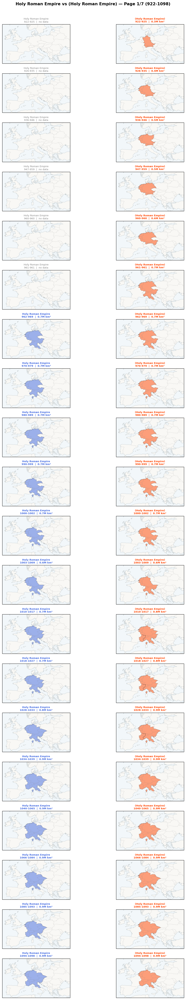

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

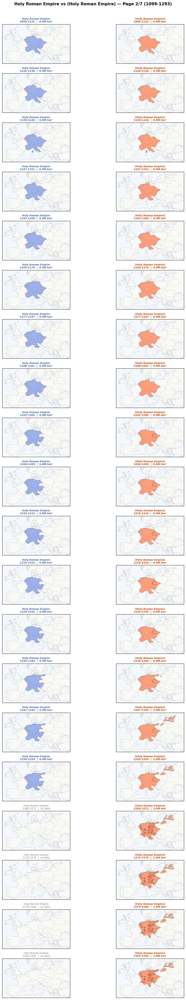

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

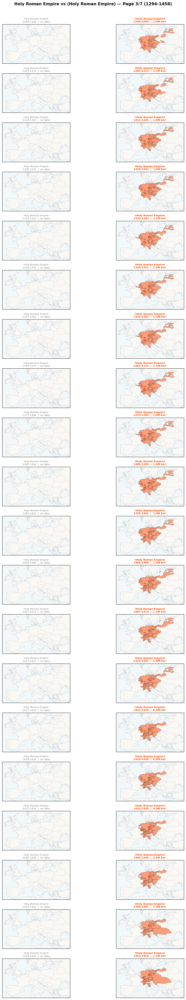

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


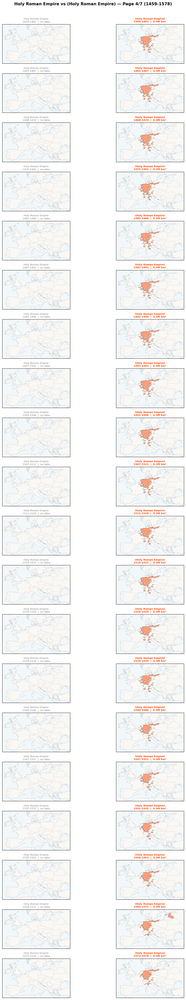

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

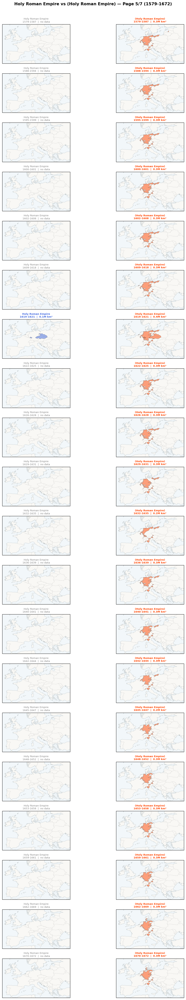

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

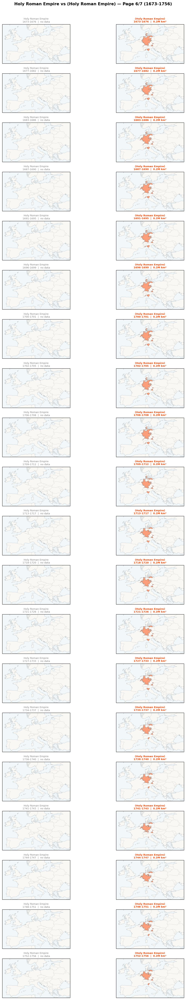

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/home/claudeuser/.local/lib/python3.11/site-packages/cartopy/mpl/feature_artist.

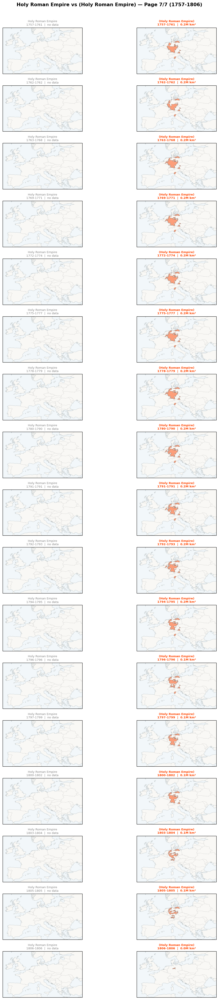

In [11]:
ROWS_PER_PAGE = 20

n_pages = math.ceil(len(all_keys) / ROWS_PER_PAGE)

for page in range(n_pages):
    start = page * ROWS_PER_PAGE
    end = min(start + ROWS_PER_PAGE, len(all_keys))
    keys_page = all_keys[start:end]
    nrows = len(keys_page)
    
    fig, axes = plt.subplots(nrows, 2, figsize=(12, nrows * 2.2),
                             subplot_kw={'projection': ccrs.PlateCarree()})
    if nrows == 1:
        axes = [axes]
    
    for row_idx, key in enumerate(keys_page):
        fy, ty = key
        
        # Left: Holy Roman Empire (blue)
        ax_l = axes[row_idx][0]
        ax_l.add_feature(cfeature.BORDERS, linewidth=0.3, color='gray', alpha=0.5)
        ax_l.add_feature(cfeature.COASTLINE, linewidth=0.3, color='gray', alpha=0.5)
        ax_l.add_feature(cfeature.LAND, color='#f0efe6', alpha=0.4)
        ax_l.add_feature(cfeature.OCEAN, color='#d4e6f1', alpha=0.3)
        ax_l.set_extent(EXTENT)
        
        cp = clean_periods.get(key)
        if cp:
            plot_polygon(ax_l, cp['geom'], '#4169E1')
            ax_l.set_title(f"Holy Roman Empire\n{fy}-{ty}  |  {cp['area']/1e6:.1f}M km²",
                          fontsize=8, fontweight='bold', color='#4169E1')
        else:
            ax_l.set_title(f"Holy Roman Empire\n{fy}-{ty}  |  no data",
                          fontsize=8, color='gray')
        
        # Right: (Holy Roman Empire) (red)
        ax_r = axes[row_idx][1]
        ax_r.add_feature(cfeature.BORDERS, linewidth=0.3, color='gray', alpha=0.5)
        ax_r.add_feature(cfeature.COASTLINE, linewidth=0.3, color='gray', alpha=0.5)
        ax_r.add_feature(cfeature.LAND, color='#f0efe6', alpha=0.4)
        ax_r.add_feature(cfeature.OCEAN, color='#d4e6f1', alpha=0.3)
        ax_r.set_extent(EXTENT)
        
        pp = paren_periods.get(key)
        if pp:
            plot_polygon(ax_r, pp['geom'], '#FF4500')
            ax_r.set_title(f"(Holy Roman Empire)\n{fy}-{ty}  |  {pp['area']/1e6:.1f}M km²",
                          fontsize=8, fontweight='bold', color='#FF4500')
        else:
            ax_r.set_title(f"(Holy Roman Empire)\n{fy}-{ty}  |  no data",
                          fontsize=8, color='gray')
    
    year_range = f"{keys_page[0][0]}-{keys_page[-1][1]}"
    fig.suptitle(f"Holy Roman Empire vs (Holy Roman Empire) — Page {page+1}/{n_pages} ({year_range})",
                 fontsize=13, fontweight='bold', y=1.005)
    plt.tight_layout()
    plt.show()

In [12]:
conn_hre.close()

In [13]:
print("=" * 70)
print("SUMMARY: Tang Dynasty vs (Tang Dynasty)")
print("=" * 70)

for name, pid in tang_ids.items():
    cur = conn.execute(
        "SELECT type, wikipedia_url, wikidata_id, number_individuals FROM polities_cliopatria WHERE id = ?",
        (pid,)
    )
    meta = dict(cur.fetchone())
    
    cur = conn.execute(
        "SELECT COUNT(*), MIN(from_year), MAX(to_year) FROM polities_periods_cliopatria WHERE polity_id = ?",
        (pid,)
    )
    pp = cur.fetchone()
    
    cur = conn.execute(
        "SELECT COUNT(*) FROM individuals_cliopatria WHERE polity_id = ?",
        (pid,)
    )
    ind_count = cur.fetchone()[0]
    
    print(f"\n{name} (id={pid}):")
    print(f"  Type:           {meta['type']}")
    print(f"  Wikipedia:      {meta['wikipedia_url']}")
    print(f"  Wikidata:       {meta['wikidata_id']}")
    print(f"  Periods:        {pp[0]} ({pp[1]} - {pp[2]} CE)")
    print(f"  Individuals:    {ind_count:,d}")

print("\n" + "=" * 70)
print("CONCLUSION")
print("=" * 70)
print("Both entries are complete duplicates in terms of geography:")
print("  - Same Wikipedia URL and Wikidata ID (Q9683)")
print("  - Same 32 time periods (623-910 CE)")
print("  - Same areas for every period")
print("  - Identical polygons (byte-for-byte) for every period")
print()
print("The ONLY difference is individual matching:")
print("  - 'Tang Dynasty' has 32,395 individuals assigned")
print("  - '(Tang Dynasty)' has 0 individuals assigned")
print()
print("The parenthesized version is a component/member polity from the")
print("original Cliopatria GeoJSON. It is a full duplicate of the")
print("non-parenthesized entry with no unique data.")
print("=" * 70)

SUMMARY: Tang Dynasty vs (Tang Dynasty)

(Tang Dynasty) (id=373):
  Type:           POLITY
  Wikipedia:      https://en.wikipedia.org/wiki/Tang_dynasty
  Wikidata:       Q9683
  Periods:        32 (623 - 910 CE)
  Individuals:    0

Tang Dynasty (id=371):
  Type:           POLITY
  Wikipedia:      https://en.wikipedia.org/wiki/Tang_dynasty
  Wikidata:       Q9683
  Periods:        32 (623 - 910 CE)
  Individuals:    32,395

CONCLUSION
Both entries are complete duplicates in terms of geography:
  - Same Wikipedia URL and Wikidata ID (Q9683)
  - Same 32 time periods (623-910 CE)
  - Same areas for every period
  - Identical polygons (byte-for-byte) for every period

The ONLY difference is individual matching:
  - 'Tang Dynasty' has 32,395 individuals assigned
  - '(Tang Dynasty)' has 0 individuals assigned

The parenthesized version is a component/member polity from the
original Cliopatria GeoJSON. It is a full duplicate of the
non-parenthesized entry with no unique data.


In [14]:
conn.close()